# Spatial coherence simulations

This notebook runs the two spatial coherence simulations reported in the revision. The simulation and plotting functions are provided in `scripts/coherence_simulation/`, and the cells below specify the parameters used for each analysis.

**Data source:** Synthetic datasets generated by the notebook and scripts/coherence_simulation/; no external accession is required.

In [1]:
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import pandas as pd

repo_root = Path.cwd()
if not (repo_root / "scripts").exists():
    repo_root = Path("../..").resolve()
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

from scripts.coherence_simulation.composition_driven_coherence import (
    SpatialCoherenceSimulator,
    run_step,
    validate_step,
)
from scripts.coherence_simulation.local_ccc_negative_coherence import (
    LocalCCCSimulator,
    run_step_ccc,
    validate_ccc_simulation,
    visualize_ccc_validation,
)
from scripts.coherence_simulation.plot_coherence_validation import visualize_from_h5ad

out_dir = repo_root / "workflows" / "coherence_simulation"
out_dir.mkdir(parents=True, exist_ok=True)

## Known cell-state and spatial-domain simulation

A 50 x 50 grid with known cell-state and spatial-domain labels is used to evaluate the cell-intrinsic and spatially aggregated representations together with STEP spatial coherence.

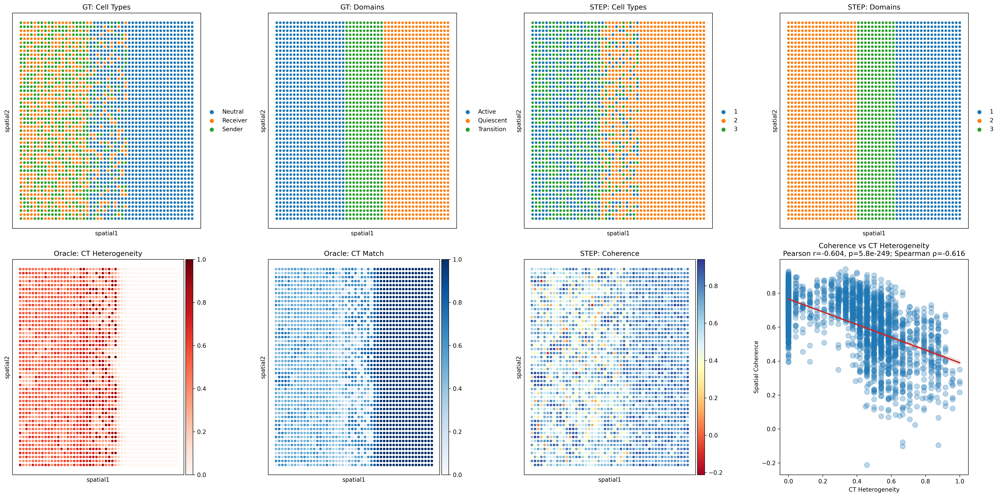

In [2]:
simulator = SpatialCoherenceSimulator(
    grid_size=(50, 50),
    n_genes=200,
    random_seed=42,
)
adata = simulator.simulate(diffusion_hops=3, oracle_hops=3)
adata.write(out_dir / "simulation_grid_based.h5ad")

adata, step_model = run_step(
    adata,
    n_glayers=3,
    n_clusters_domain=3,
    n_clusters_ct=3,
)
composition_metrics = validate_step(adata)
composition_result = out_dir / "simulation_with_step_results.h5ad"
adata.write(composition_result)
pd.Series(composition_metrics).to_json(
    out_dir / "composition_validation_metrics.json",
    indent=2,
)
composition_figure, _ = visualize_from_h5ad(
    composition_result,
    save_path=out_dir / "coherence_validation.png",
)
composition_figure

## Local communication-driven simulation

A 50 x 50 grid with six cell states and communication restricted to radius 2.5 is used to evaluate the continuous relationship between communication strength and STEP spatial coherence.

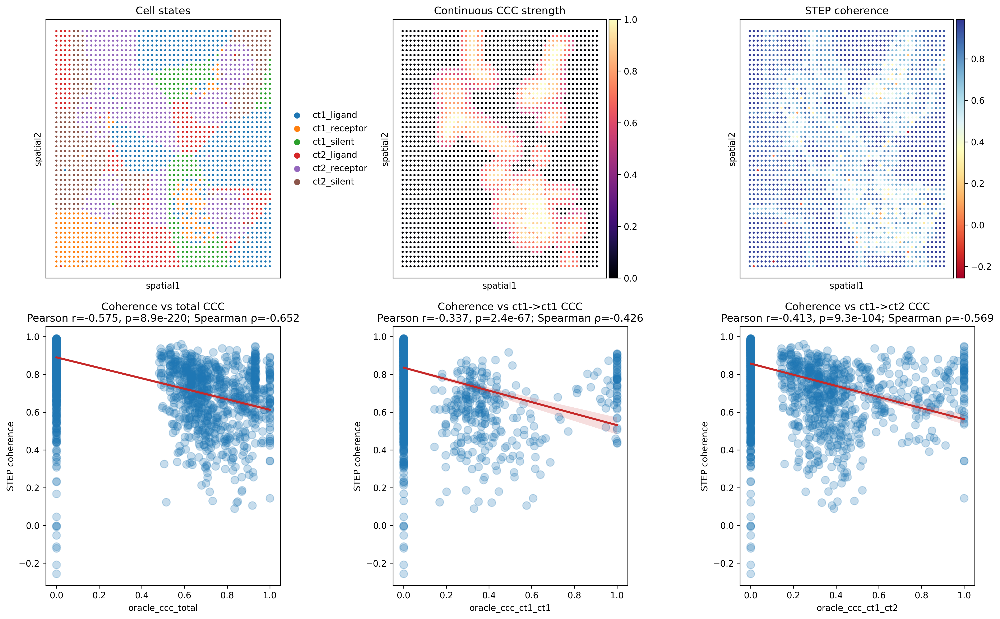

In [3]:
ccc_simulator = LocalCCCSimulator(
    grid_size=(50, 50),
    n_genes=240,
    random_seed=42,
)
ccc_adata = ccc_simulator.simulate(
    ccc_radius=2.5,
    effect_strength=1.2,
    incoherence_strength=1.8,
    n_hotspots=5,
    hotspot_radius=4.5,
)
ccc_adata.write(out_dir / "simulation_local_ccc_negative_coherence.h5ad")

ccc_adata, ccc_step_model = run_step_ccc(ccc_adata, n_glayers=3)
ccc_metrics = validate_ccc_simulation(ccc_adata)
ccc_figure = visualize_ccc_validation(
    ccc_adata,
    save_path=out_dir / "ccc_validation.png",
)
ccc_adata.write(out_dir / "simulation_local_ccc_negative_coherence_with_step.h5ad")
pd.Series(ccc_metrics).to_json(
    out_dir / "ccc_validation_metrics.json",
    indent=2,
)
ccc_figure